In [130]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
def plot_image(test_image,hard_pred_ori,mask_Fuse):
    # original image, UniverSeg, Ours
    plt.figure(figsize = (10,5))
    plt.subplot(1,3,1)
    plt.imshow(test_image.permute(0,2,3,1)[0])
    plt.title('Image')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(test_image.permute(0,2,3,1)[0])
    show_mask(hard_pred_ori[0,0,:], plt.gca())
    plt.title('Universeg\'s Prediction')
    plt.axis('off')
    plt.subplot(1,3,3)
    plt.imshow(test_image.permute(0,2,3,1)[0])
    show_mask(mask_Fuse, plt.gca())
    plt.title(' ICL-SAM Prediction')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
def compute_iou(pred_mask, gt_mask):
    pred_mask = pred_mask.astype(bool)
    gt_mask = gt_mask.astype(bool)

    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()

    if union == 0:
        return float(intersection == 0)
    return intersection / union


In [131]:
import torch
from torch.nn import functional as F

import os
import cv2
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

from utils.UniSeg_SAM import *

In [132]:
# Set the checkpoint path first
# SAM_Checkpoint = '/userhome/jiesi/dataset/MedSAM/medsam_vit_b.pth'
SAM_Checkpoint = './checkpoints/sam_vit_b_01ec64.pth'

### Load data

In [133]:
ref_folder = './data/fg/support/image/' # Path of support set
inf_folder = './data/fg/query/image/' # Path of query set

In [134]:
# Support Set
ref_image_paths = sorted(os.listdir(ref_folder))
ref_image_paths = [os.path.join(ref_folder,i) for i in ref_image_paths if '.png' in i]
print('Total length of support set:',len(ref_image_paths))

support_mask_list, support_image_list = [], []
for test_image_path in ref_image_paths:
    test_mask_path = test_image_path.replace('/image/','/mask/')
    
    test_image = cv2.imread(test_image_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_mask = cv2.imread(test_mask_path)
    test_mask = cv2.cvtColor(test_mask, cv2.COLOR_BGR2RGB)
    
    test_mask = test_mask[:,:,0].astype('float')[None,None,:,:].clip(0,1)
    test_image = test_image.transpose(2,0,1)[None,:]
    
    support_mask_list.append(torch.tensor(test_mask))
    support_image_list.append(torch.tensor(test_image))

Total length of support set: 3


In [135]:
# Query set
inf_image_paths = sorted(os.listdir(inf_folder))
inf_image_paths = [os.path.join(inf_folder,i) for i in inf_image_paths if '.png' in i]
print('Total length of query set:',len(inf_image_paths))

Total length of query set: 6


### Load the model

In [136]:
# Load the model
Context_size = len(support_mask_list) 
alpha = 0.3*np.exp(-Context_size*0.1) 
beta = 2.0 
gamma = 0 # Weight for UniverSeg in mask fusion module
print('Context_size:',Context_size,'alpha:',alpha,'beta:',beta,'gamma:',gamma)

predictor = UniSAM_predictor(alpha,
                            beta,
                            gamma,
                            Context_size,
                            checkpoint = SAM_Checkpoint)

Context_size: 3 alpha: 0.22224546620451535 beta: 2.0 gamma: 0
sam.MedSAM_norm: False


### Dual-Branch Fusion

In [137]:
predictor.set_support_images_bg(
        support_image_list,
        support_mask_list,
        )
predictor.set_support_images_fg(
        support_image_list,
        support_mask_list,
        )

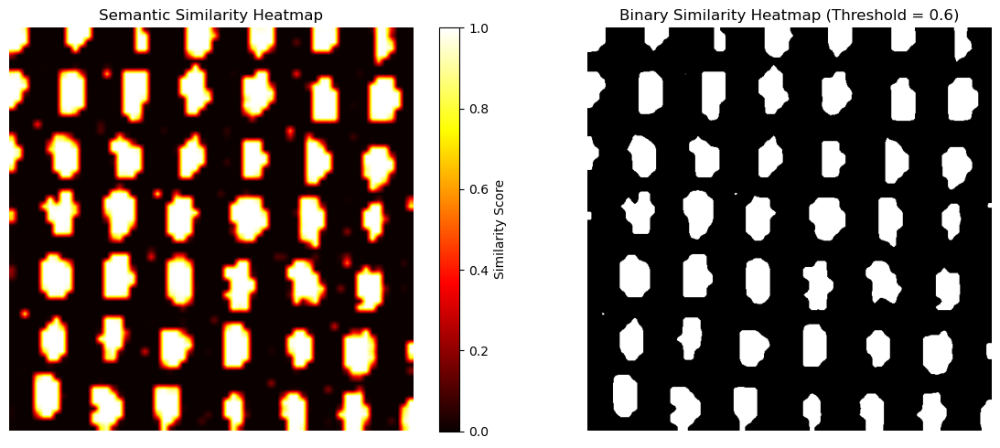

000000.png: IoU=0.875, Dice=0.934, Precision=0.917, Recall=0.950


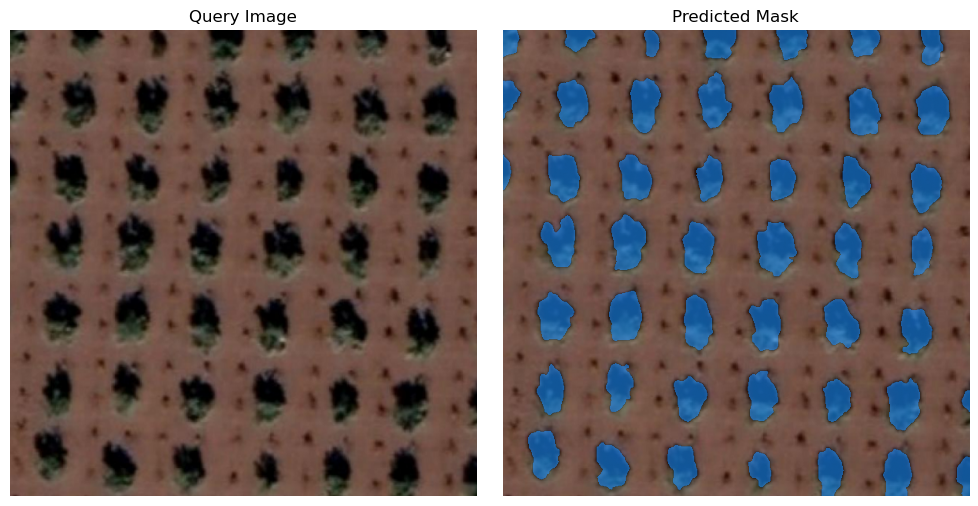

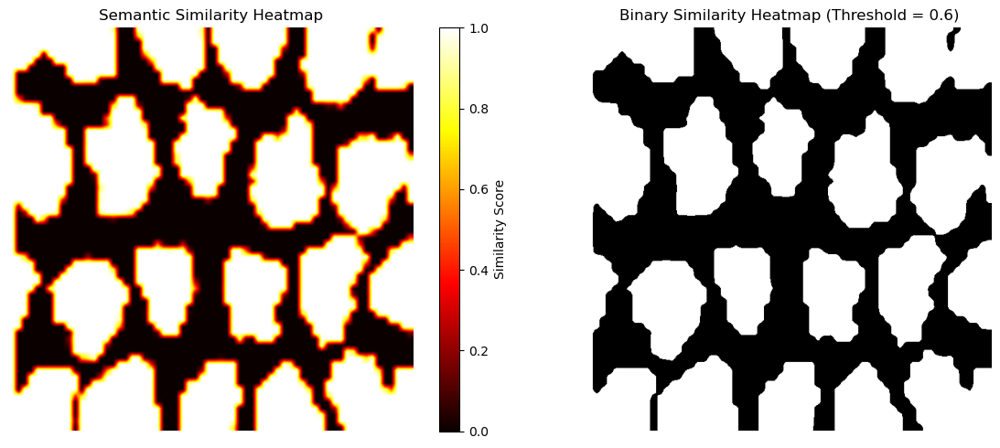

0000000.png: IoU=0.908, Dice=0.952, Precision=0.996, Recall=0.911


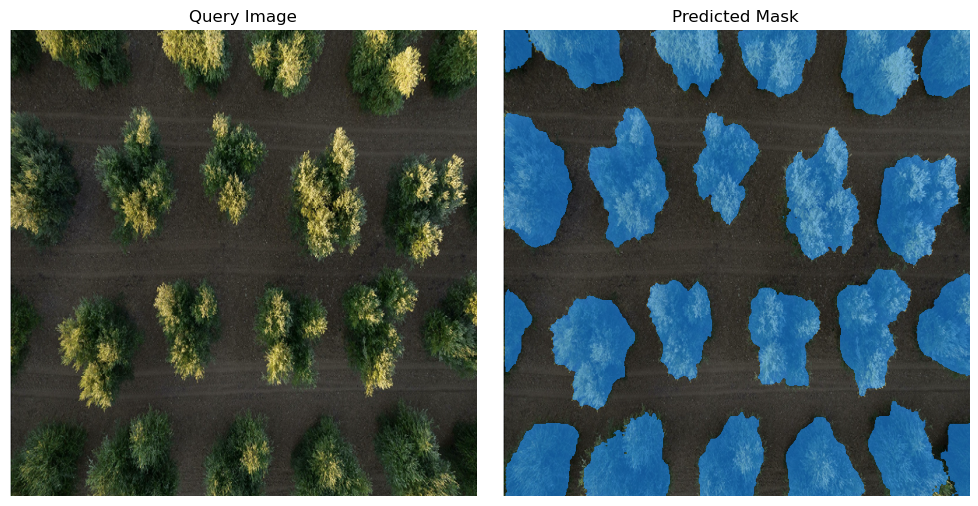

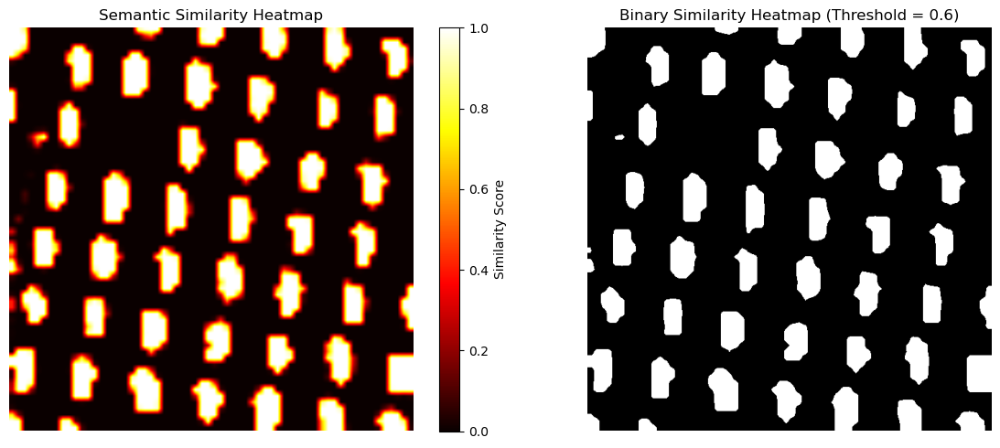

02.png: IoU=0.783, Dice=0.878, Precision=0.928, Recall=0.833


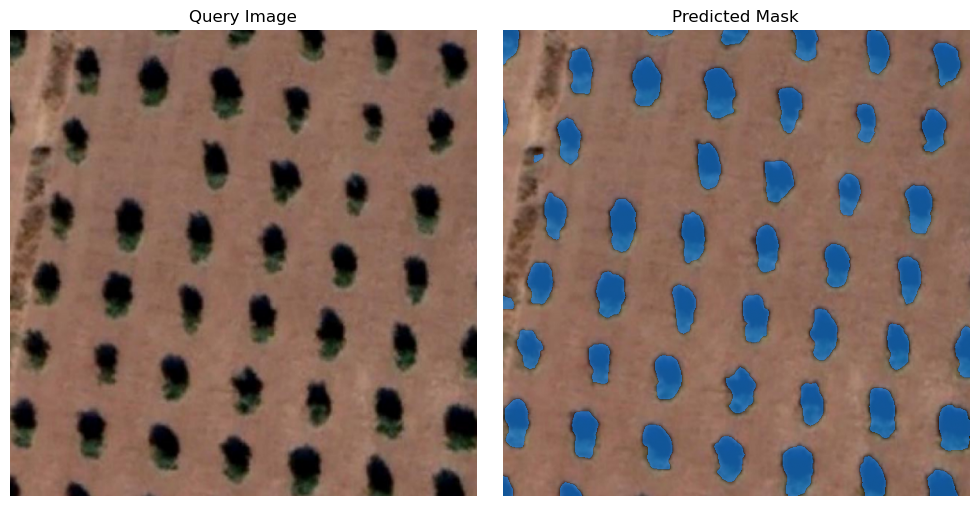

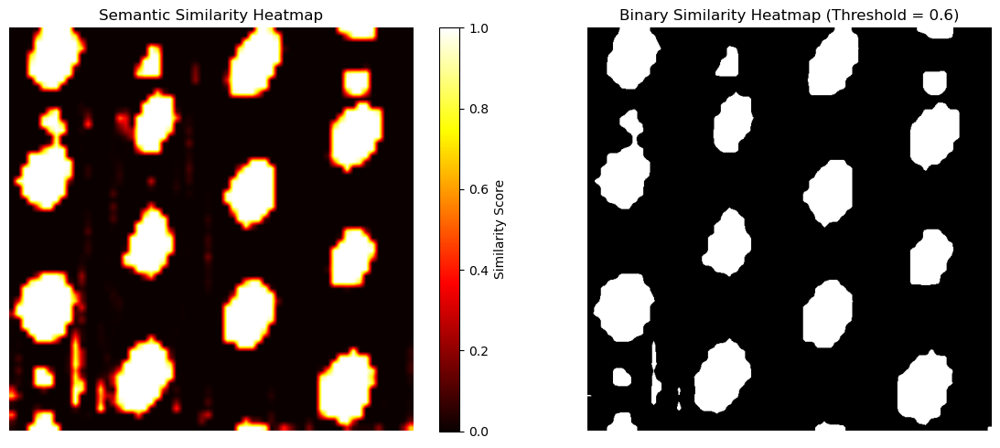

1.png: IoU=0.837, Dice=0.911, Precision=0.882, Recall=0.942


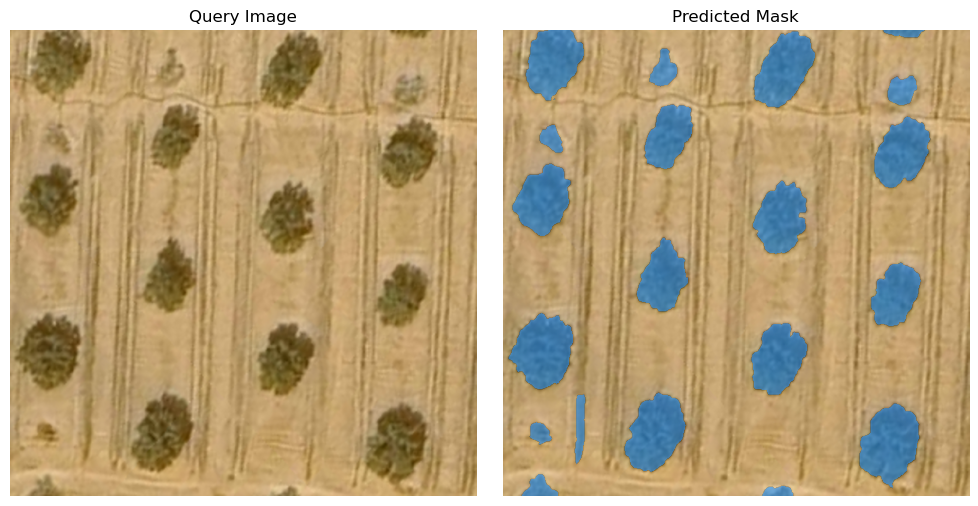

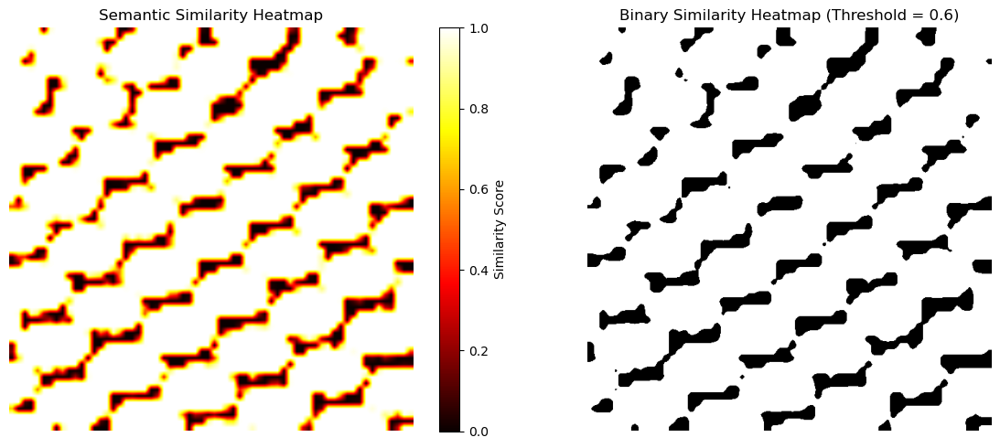

7png.png: IoU=0.790, Dice=0.883, Precision=0.953, Recall=0.822


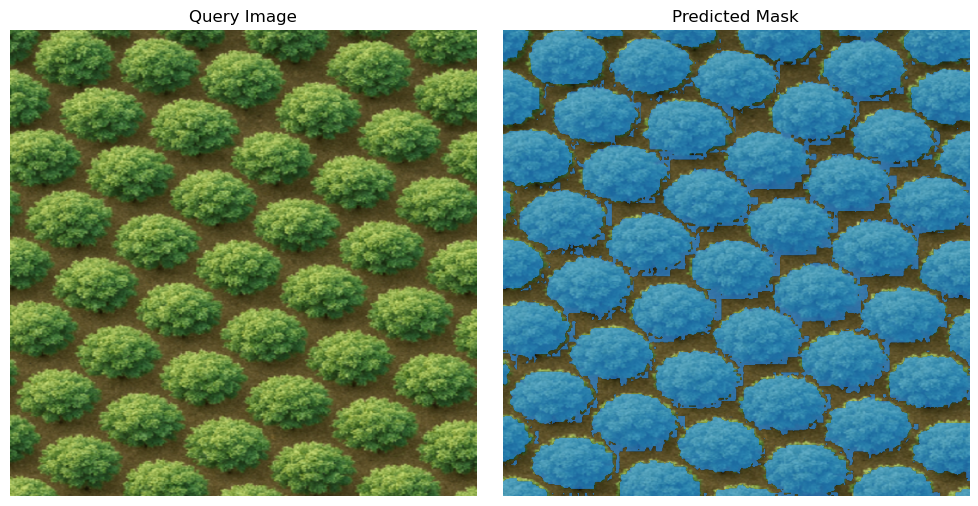

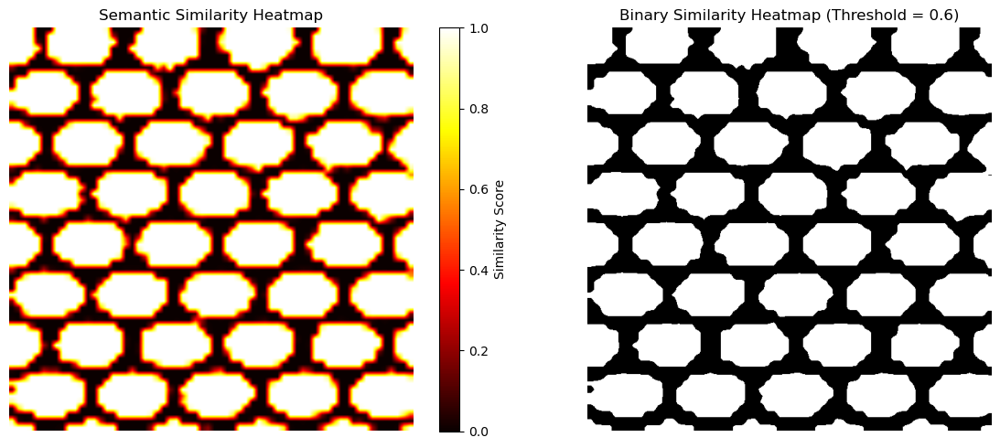

8png.png: IoU=0.755, Dice=0.861, Precision=1.000, Recall=0.755


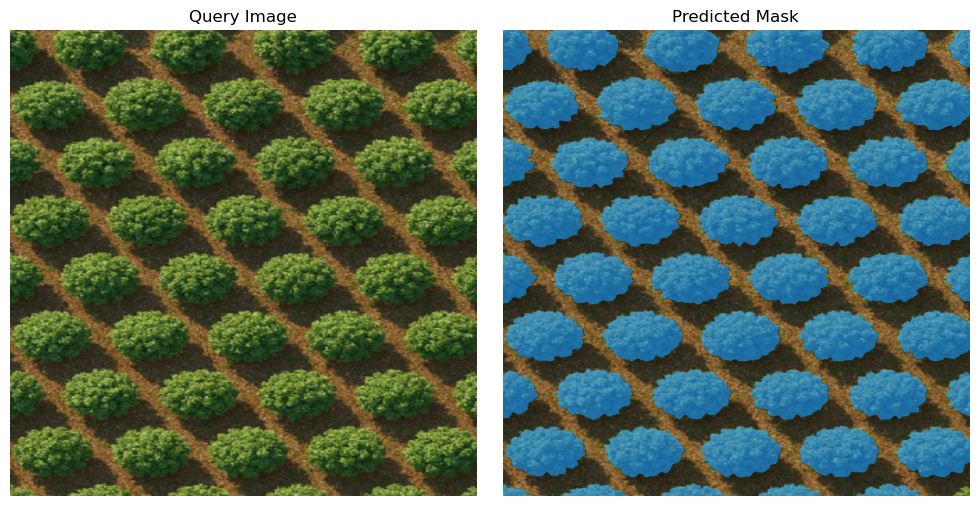


=== Average Metrics ===
IoU:       0.825
Dice:      0.903
Precision: 0.946
Recall:    0.869


In [138]:
import torch
from torch.nn import functional as F
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Paths
ref_folder = './data/fg/support/image/'
inf_folder = './data/fg/query/image/'
mask_folder = './data/fg/query/mask/'

# List of query image paths
inf_image_paths = [os.path.join(inf_folder, f) for f in os.listdir(inf_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])  # Light blue with alpha
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# ------------------------
# Metric computation utils
# ------------------------
def compute_metrics(pred_mask, gt_mask):
    """
    pred_mask, gt_mask: binary numpy arrays (0 or 1)
    """
    pred_mask = pred_mask.astype(np.bool_)
    gt_mask = gt_mask.astype(np.bool_)

    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    pred_sum = pred_mask.sum()
    gt_sum = gt_mask.sum()

    # Avoid division by zero
    iou = intersection / union if union != 0 else 1.0
    dice = (2 * intersection) / (pred_sum + gt_sum) if (pred_sum + gt_sum) != 0 else 1.0
    precision = intersection / pred_sum if pred_sum != 0 else 1.0
    recall = intersection / gt_sum if gt_sum != 0 else 1.0

    return iou, dice, precision, recall

# ------------------------
# Inference + Evaluation
# ------------------------
results = []

for test_image_path in inf_image_paths:
    filename = os.path.basename(test_image_path)
    mask_path = os.path.join(mask_folder, filename)

    # Load image
    test_image = cv2.imread(test_image_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_image_tensor = torch.tensor(test_image.transpose(2, 0, 1)[None, :])  # (1, 3, H, W)

    # Predict mask (example — replace this with your real model)
    mask = predictor.predict(test_image_tensor)  # output: numpy or torch

    # Convert prediction to torch tensor
    if isinstance(mask, np.ndarray):
        mask_tensor = torch.tensor(mask).float()
    else:
        mask_tensor = mask.float()

    mask_tensor = mask_tensor.unsqueeze(0).unsqueeze(0)  # (1, 1, H, W)

    # Resize prediction
    pred_mask_resized = F.interpolate(mask_tensor, size=test_image.shape[:2], mode='bilinear', align_corners=False)
    pred_mask_np = pred_mask_resized[0, 0].detach().cpu().numpy()

    # Binarize
    pred_mask_bin = (pred_mask_np > 0.5).astype(np.uint8)

    # Load ground truth mask
    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    gt_mask = (gt_mask > 127).astype(np.uint8)

    # Compute metrics
    iou, dice, precision, recall = compute_metrics(pred_mask_bin, gt_mask)
    results.append((filename, iou, dice, precision, recall))

    # Show results
    print(f"{filename}: IoU={iou:.3f}, Dice={dice:.3f}, Precision={precision:.3f}, Recall={recall:.3f}")

    # Visualization (optional)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image)
    plt.title('Query Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(test_image)
    show_mask(pred_mask_bin, plt.gca())
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# ------------------------
# Aggregate metrics
# ------------------------
if results:
    ious, dices, precisions, recalls = zip(*[r[1:] for r in results])
    print("\n=== Average Metrics ===")
    print(f"IoU:       {np.mean(ious):.3f}")
    print(f"Dice:      {np.mean(dices):.3f}")
    print(f"Precision: {np.mean(precisions):.3f}")
    print(f"Recall:    {np.mean(recalls):.3f}")


### One-Branch architecture

In [127]:
predictor.set_support_images(
        support_image_list,
        support_mask_list,
        )


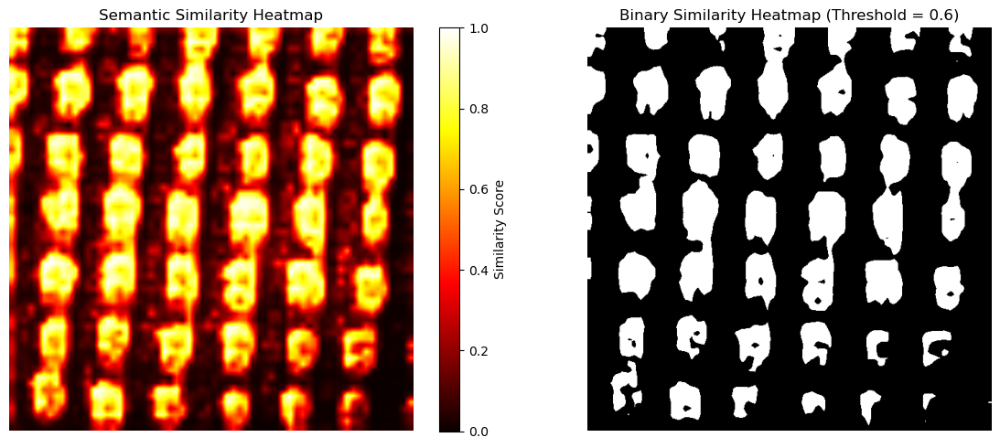

000000.png: IoU=0.884, Dice=0.938, Precision=0.919, Recall=0.959


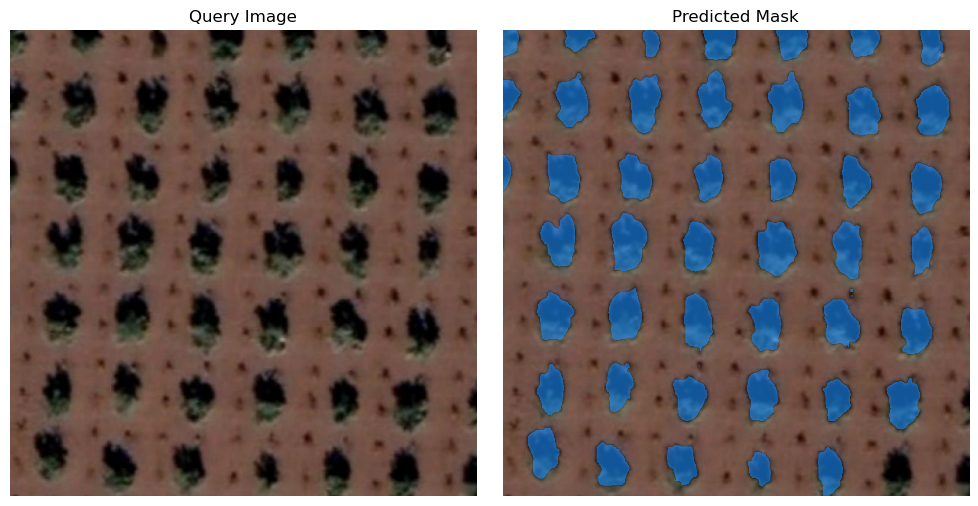

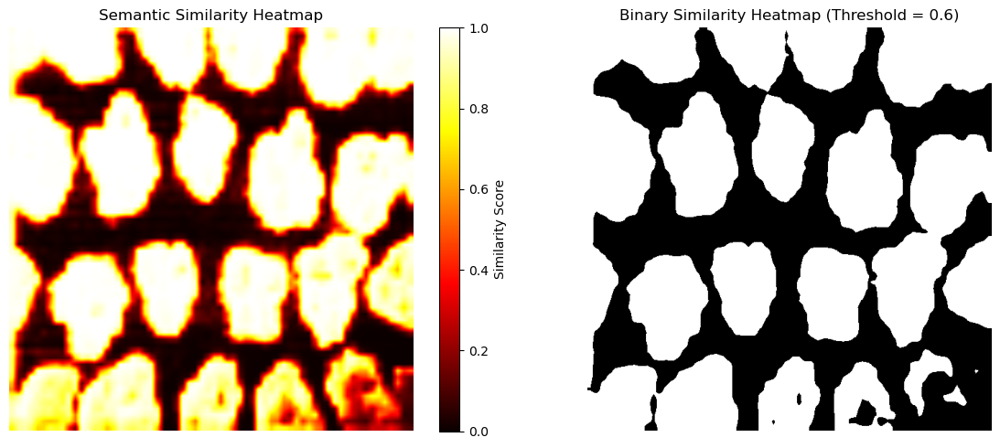

0000000.png: IoU=0.886, Dice=0.939, Precision=0.996, Recall=0.889


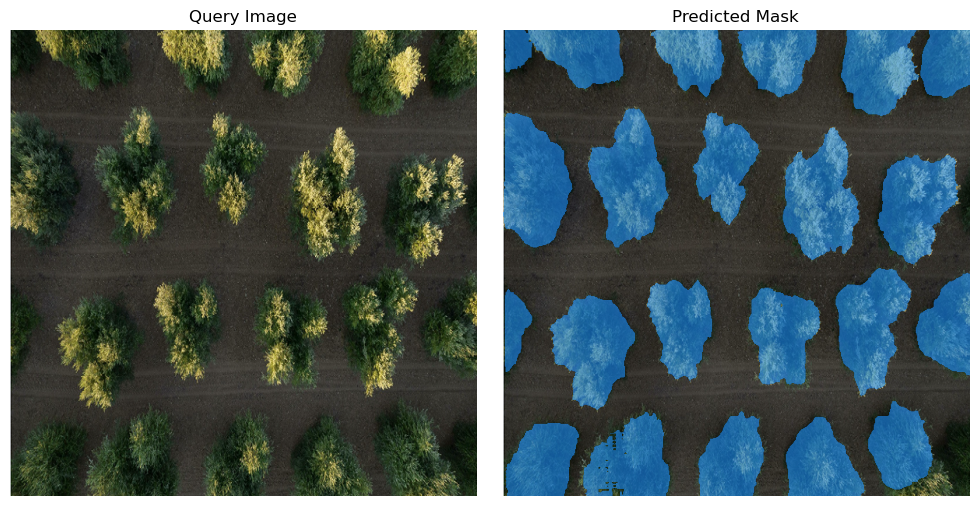

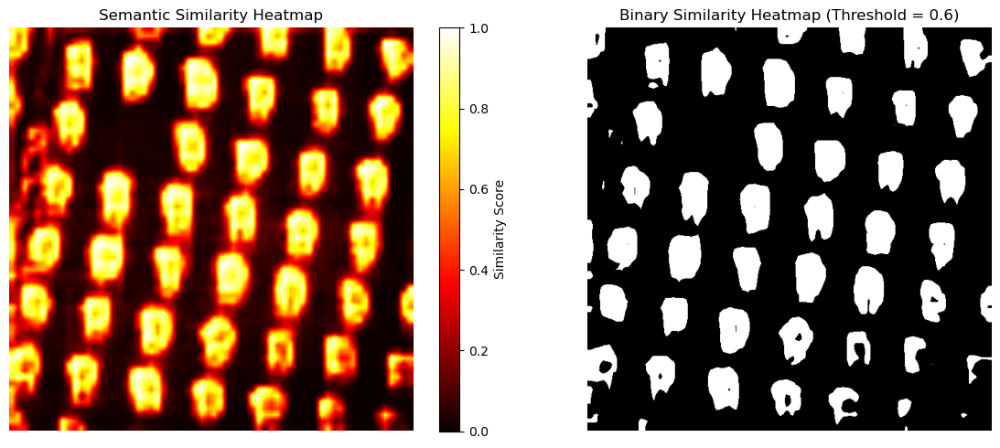

02.png: IoU=0.765, Dice=0.867, Precision=0.919, Recall=0.820


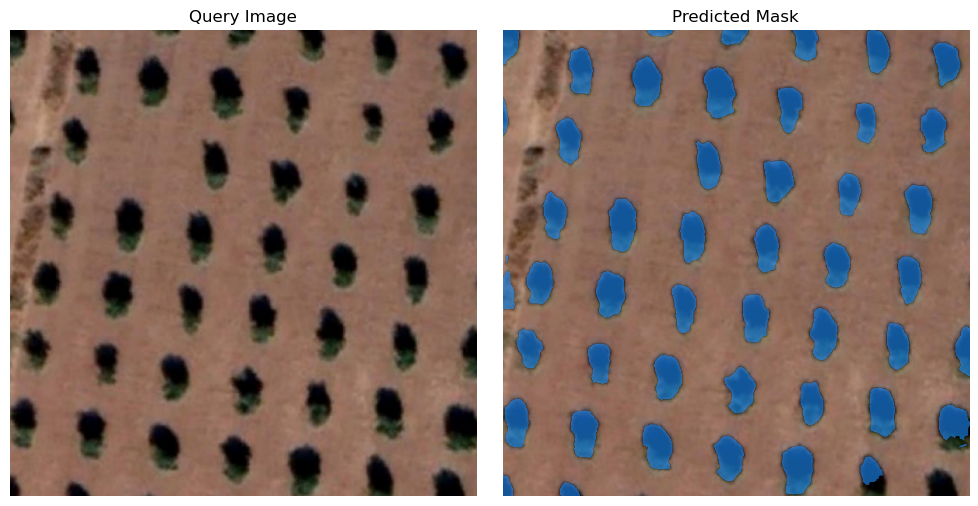

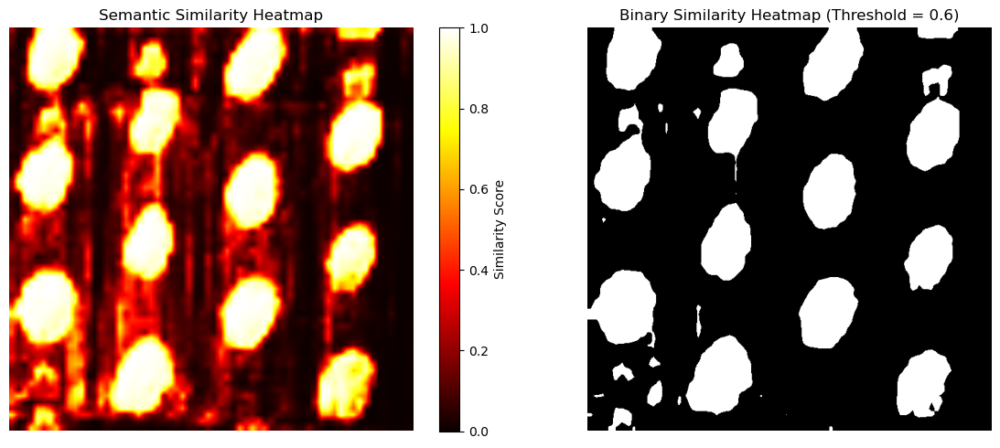

1.png: IoU=0.847, Dice=0.917, Precision=0.889, Recall=0.947


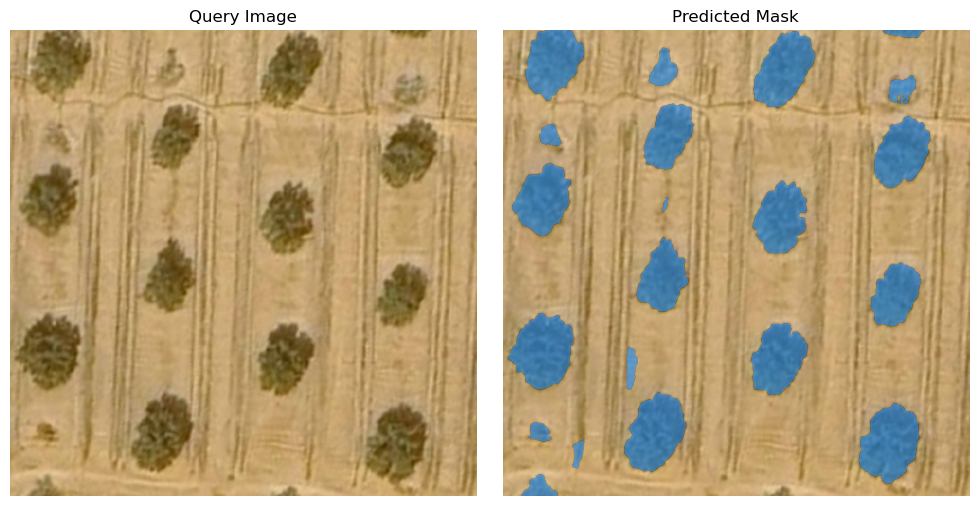

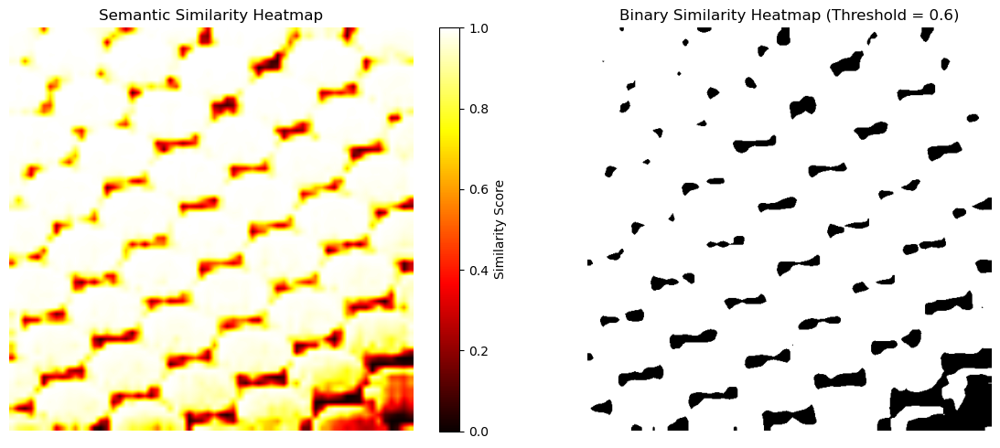

7png.png: IoU=0.821, Dice=0.902, Precision=0.914, Recall=0.890


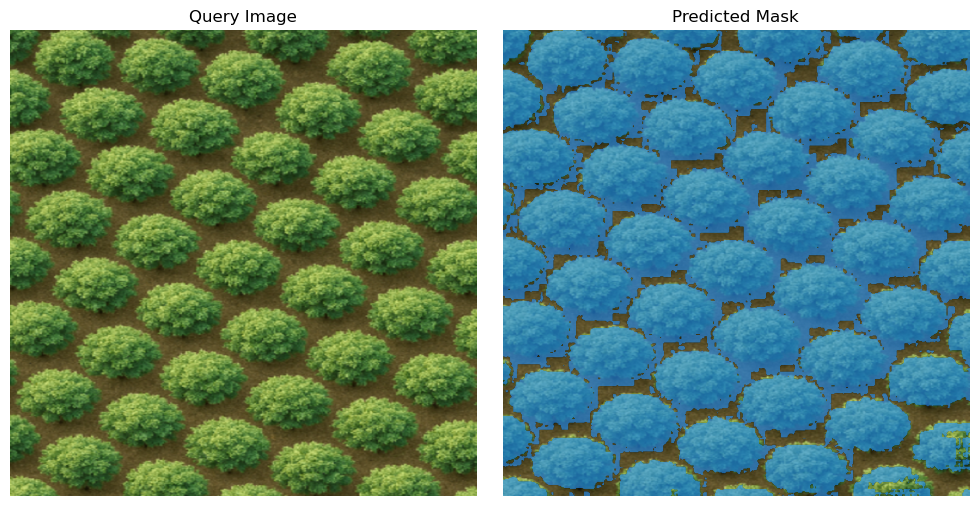

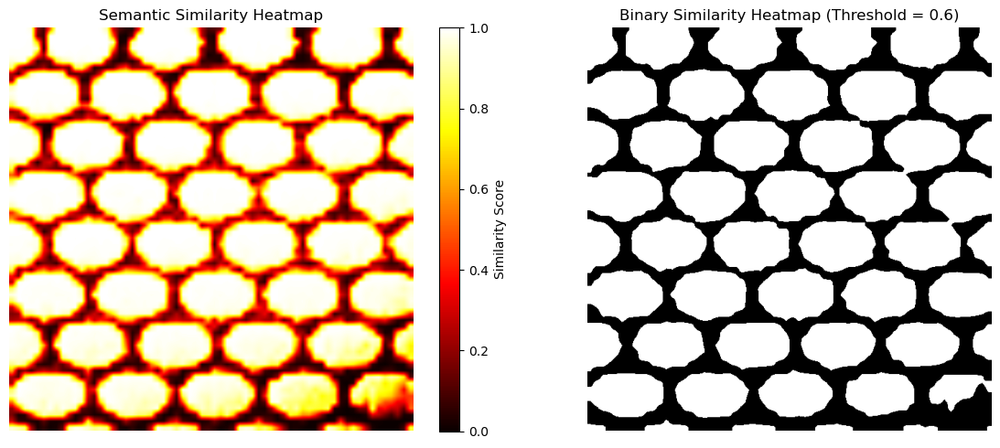

8png.png: IoU=0.725, Dice=0.841, Precision=1.000, Recall=0.725


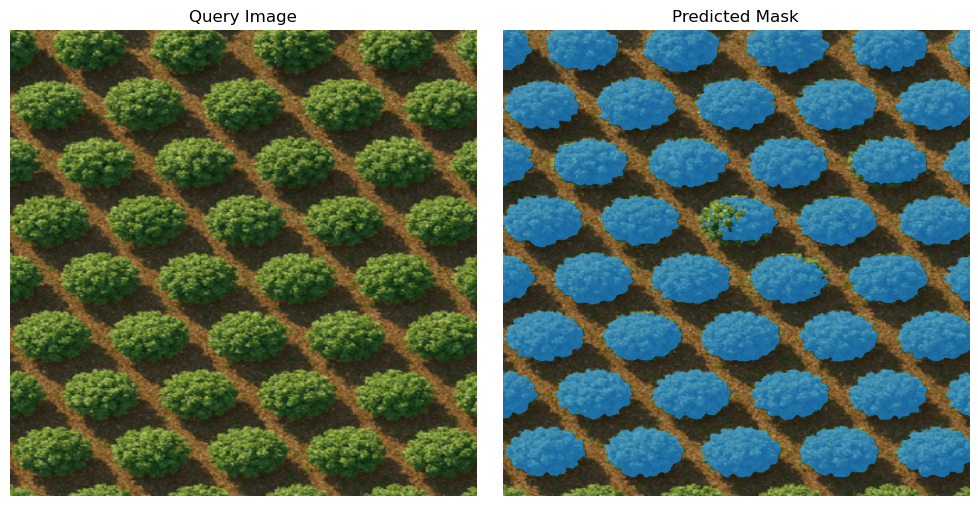


=== Average Metrics ===
IoU:       0.821
Dice:      0.901
Precision: 0.940
Recall:    0.872


In [128]:
import torch
from torch.nn import functional as F
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Paths
ref_folder = './data/fg/support/image/'
inf_folder = './data/fg/query/image/'
mask_folder = './data/fg/query/mask/'

# List of query image paths
inf_image_paths = [os.path.join(inf_folder, f) for f in os.listdir(inf_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])  # Light blue with alpha
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# ------------------------
# Metric computation utils
# ------------------------
def compute_metrics(pred_mask, gt_mask):
    """
    pred_mask, gt_mask: binary numpy arrays (0 or 1)
    """
    pred_mask = pred_mask.astype(np.bool_)
    gt_mask = gt_mask.astype(np.bool_)

    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    pred_sum = pred_mask.sum()
    gt_sum = gt_mask.sum()

    # Avoid division by zero
    iou = intersection / union if union != 0 else 1.0
    dice = (2 * intersection) / (pred_sum + gt_sum) if (pred_sum + gt_sum) != 0 else 1.0
    precision = intersection / pred_sum if pred_sum != 0 else 1.0
    recall = intersection / gt_sum if gt_sum != 0 else 1.0

    return iou, dice, precision, recall

# ------------------------
# Inference + Evaluation
# ------------------------
results = []

for test_image_path in inf_image_paths:
    filename = os.path.basename(test_image_path)
    mask_path = os.path.join(mask_folder, filename)

    # Load image
    test_image = cv2.imread(test_image_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_image_tensor = torch.tensor(test_image.transpose(2, 0, 1)[None, :])  # (1, 3, H, W)

    # Predict mask (example — replace this with your real model)
    mask = predictor.predict1(test_image_tensor)  # output: numpy or torch

    # Convert prediction to torch tensor
    if isinstance(mask, np.ndarray):
        mask_tensor = torch.tensor(mask).float()
    else:
        mask_tensor = mask.float()

    mask_tensor = mask_tensor.unsqueeze(0).unsqueeze(0)  # (1, 1, H, W)

    # Resize prediction
    pred_mask_resized = F.interpolate(mask_tensor, size=test_image.shape[:2], mode='bilinear', align_corners=False)
    pred_mask_np = pred_mask_resized[0, 0].detach().cpu().numpy()

    # Binarize
    pred_mask_bin = (pred_mask_np > 0.5).astype(np.uint8)

    # Load ground truth mask
    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    gt_mask = (gt_mask > 127).astype(np.uint8)

    # Compute metrics
    iou, dice, precision, recall = compute_metrics(pred_mask_bin, gt_mask)
    results.append((filename, iou, dice, precision, recall))

    # Show results
    print(f"{filename}: IoU={iou:.3f}, Dice={dice:.3f}, Precision={precision:.3f}, Recall={recall:.3f}")

    # Visualization (optional)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image)
    plt.title('Query Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(test_image)
    show_mask(pred_mask_bin, plt.gca())
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# ------------------------
# Aggregate metrics
# ------------------------
if results:
    ious, dices, precisions, recalls = zip(*[r[1:] for r in results])
    print("\n=== Average Metrics ===")
    print(f"IoU:       {np.mean(ious):.3f}")
    print(f"Dice:      {np.mean(dices):.3f}")
    print(f"Precision: {np.mean(precisions):.3f}")
    print(f"Recall:    {np.mean(recalls):.3f}")


#### Comparison with other models

#### ICL-SAM initial

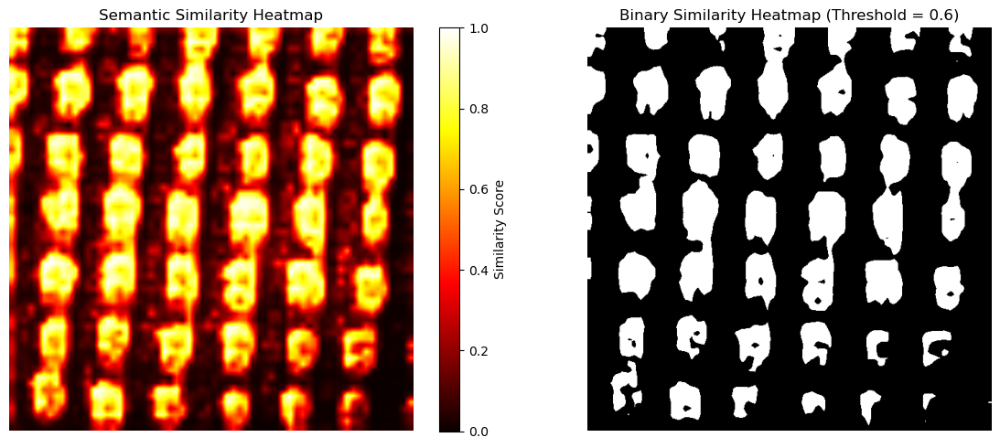

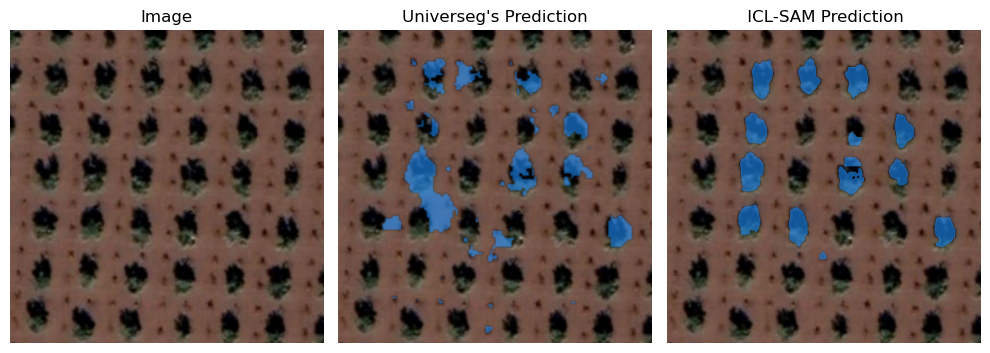

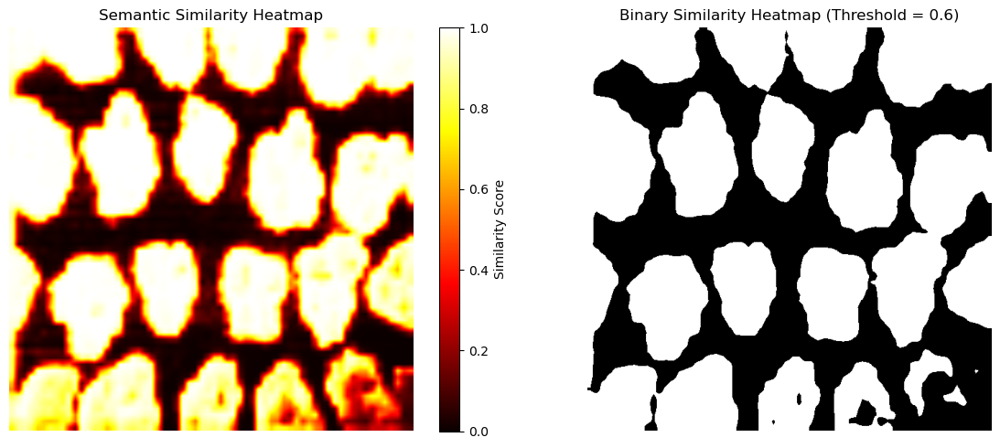

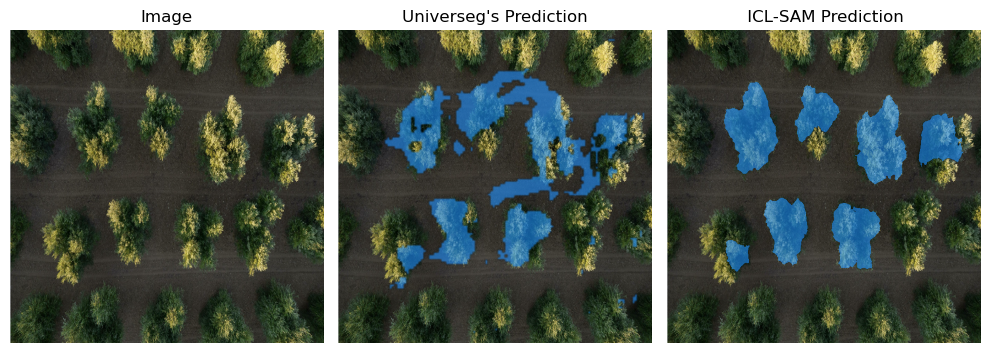

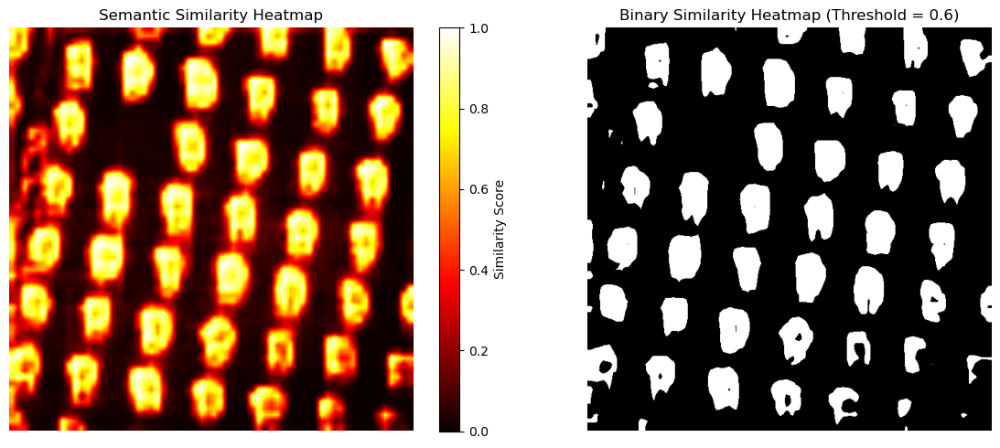

...

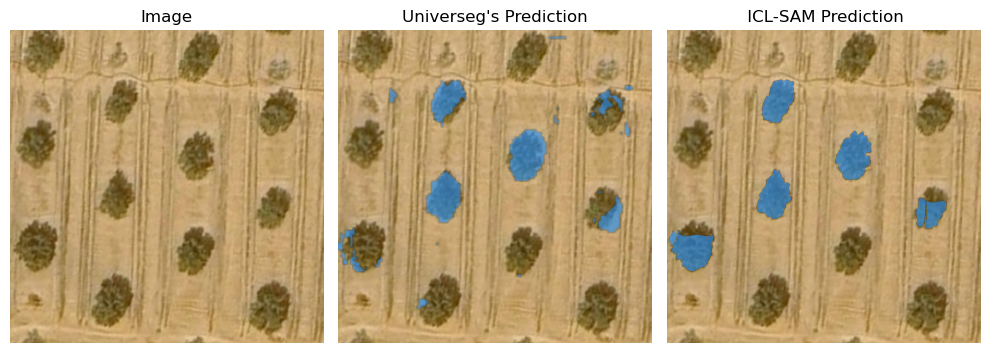

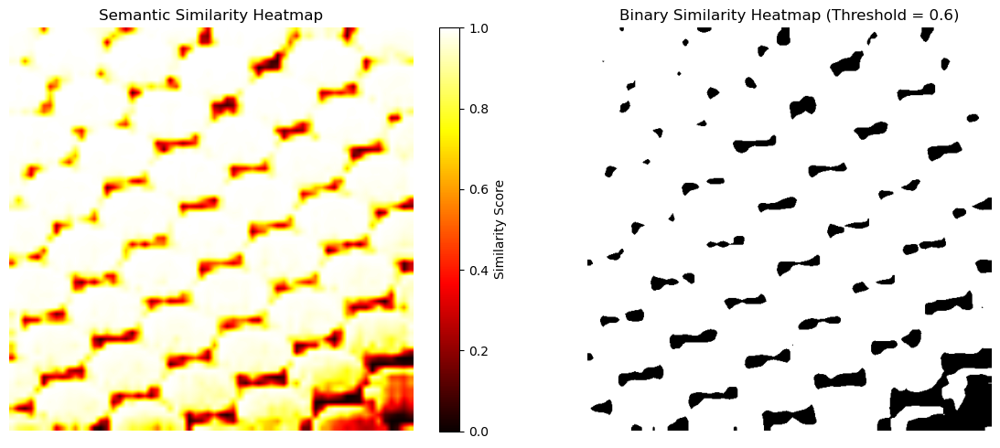

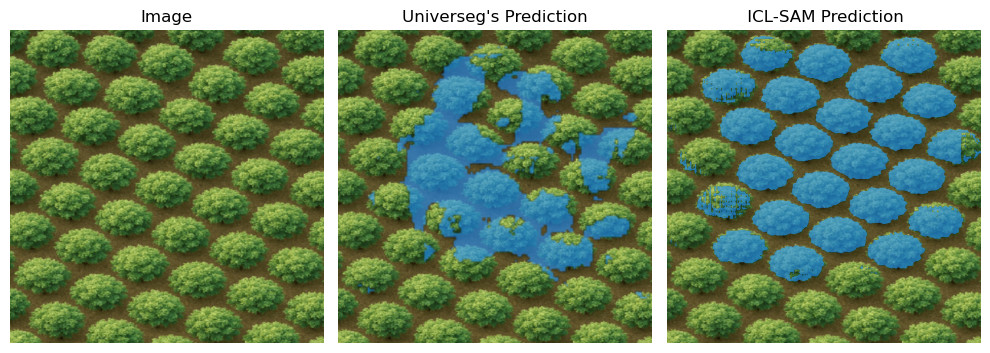

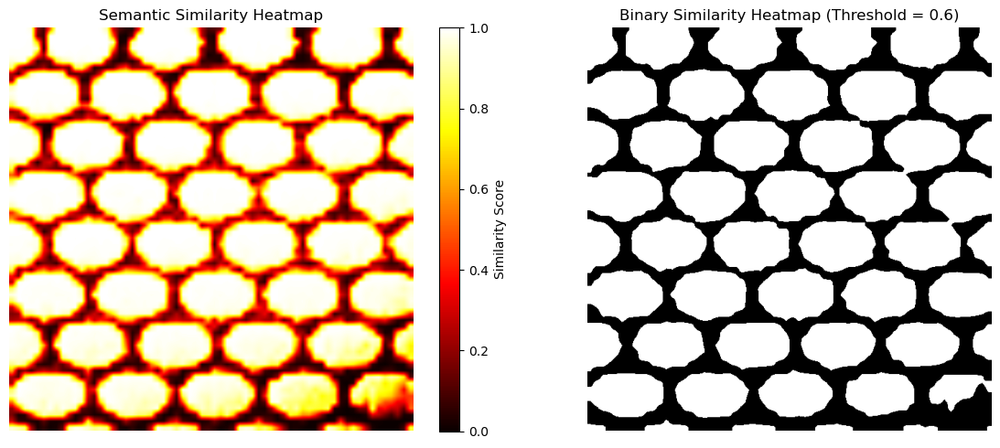

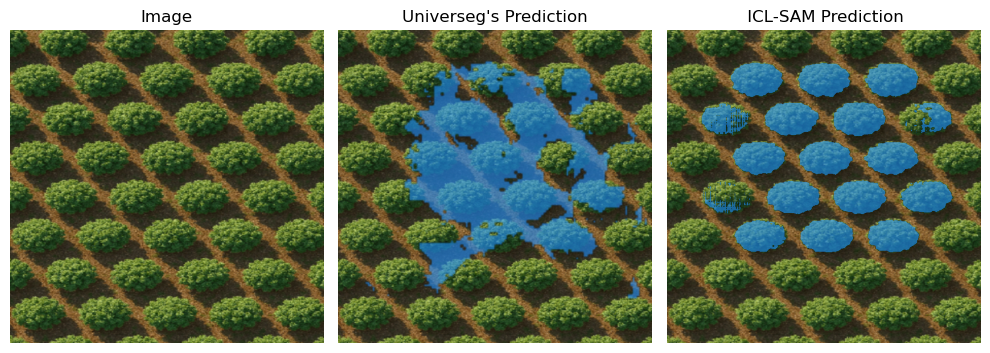

In [129]:
for i in inf_image_paths:
    test_image_path  = i
    test_image = cv2.imread(test_image_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_image = test_image.transpose(2,0,1)[None,:]
    test_image = torch.tensor(test_image)
    hard_pred_ori, _, _, mask_Fuse = predictor.predict_detailed(test_image)
    plot_image(test_image,hard_pred_ori,mask_Fuse)

### SAM Baseline Segmentation Evaluation

000000.png: IoU=0.801, Dice=0.890, Precision=0.808, Recall=0.990


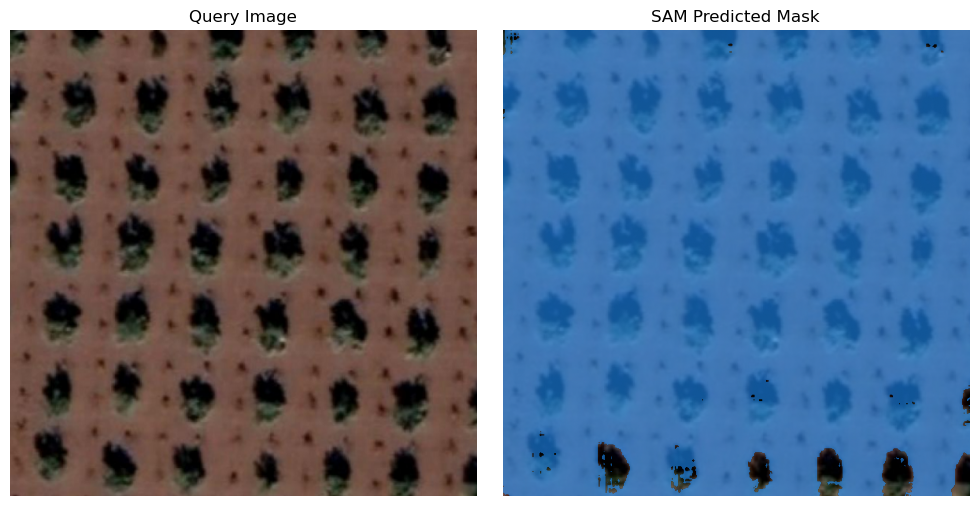

0000000.png: IoU=0.921, Dice=0.959, Precision=0.998, Recall=0.923


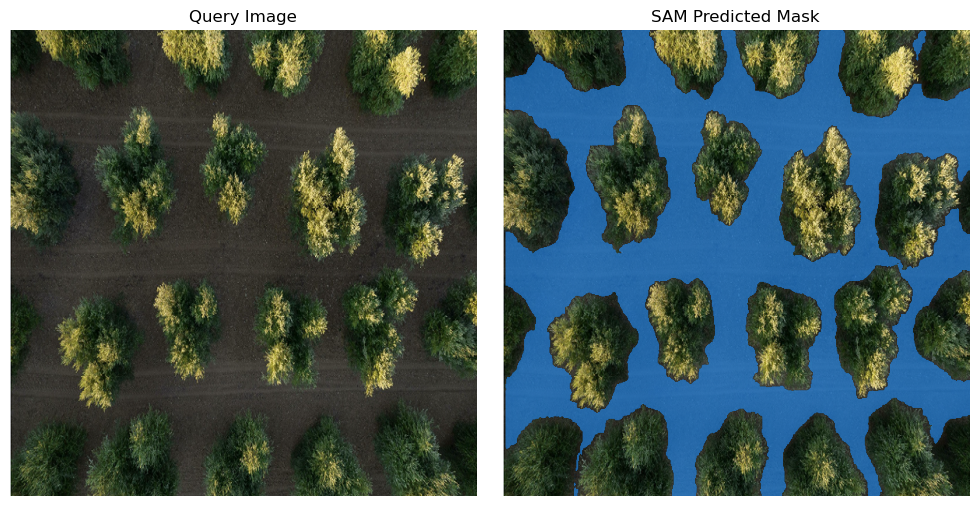

02.png: IoU=0.832, Dice=0.908, Precision=0.834, Recall=0.998


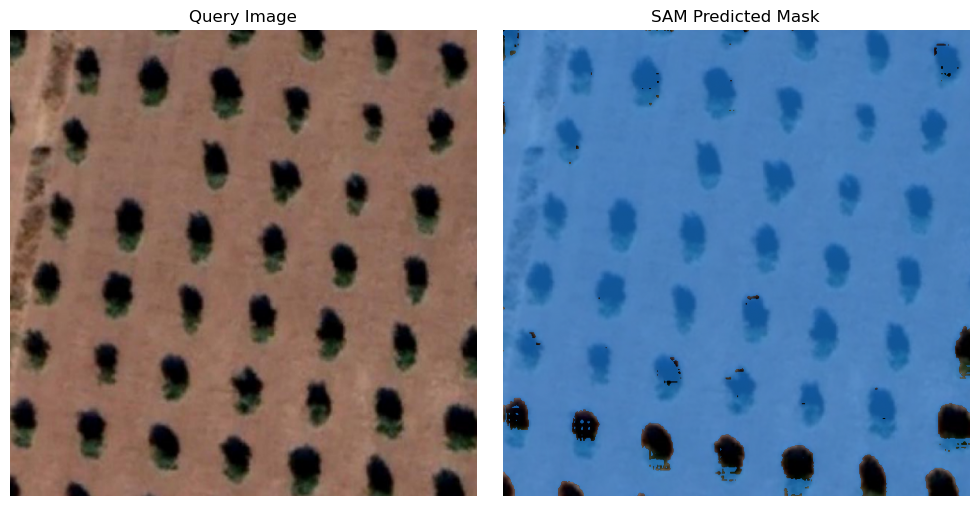

1.png: IoU=0.920, Dice=0.958, Precision=0.962, Recall=0.954


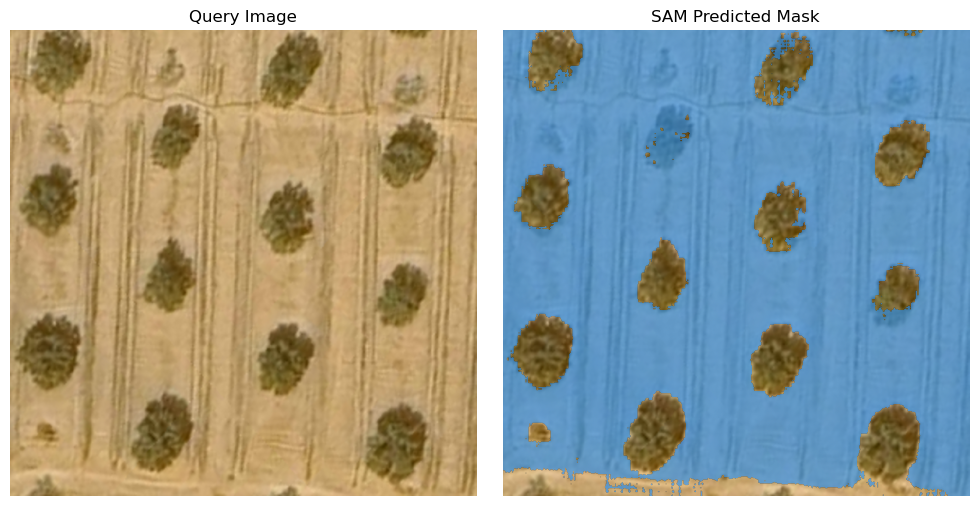

7png.png: IoU=0.000, Dice=0.000, Precision=0.000, Recall=0.000


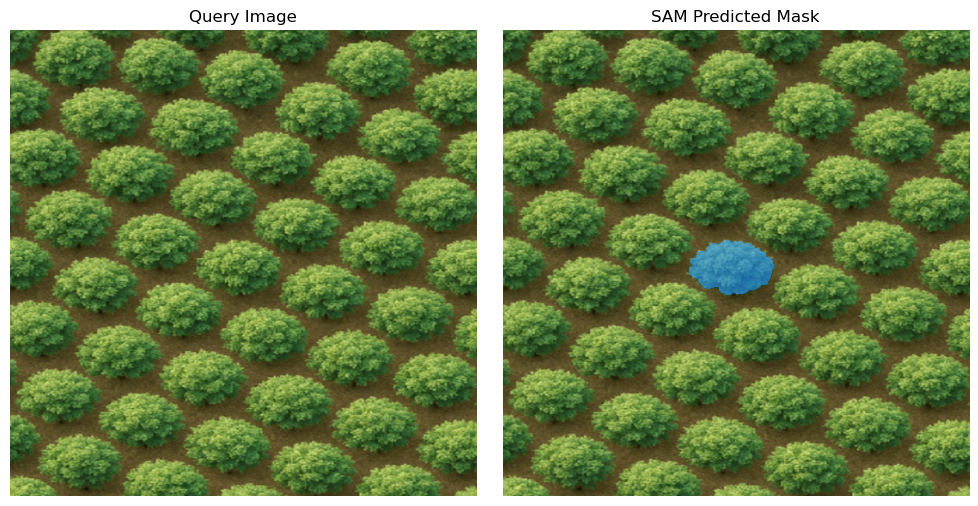

8png.png: IoU=0.683, Dice=0.811, Precision=0.702, Recall=0.960


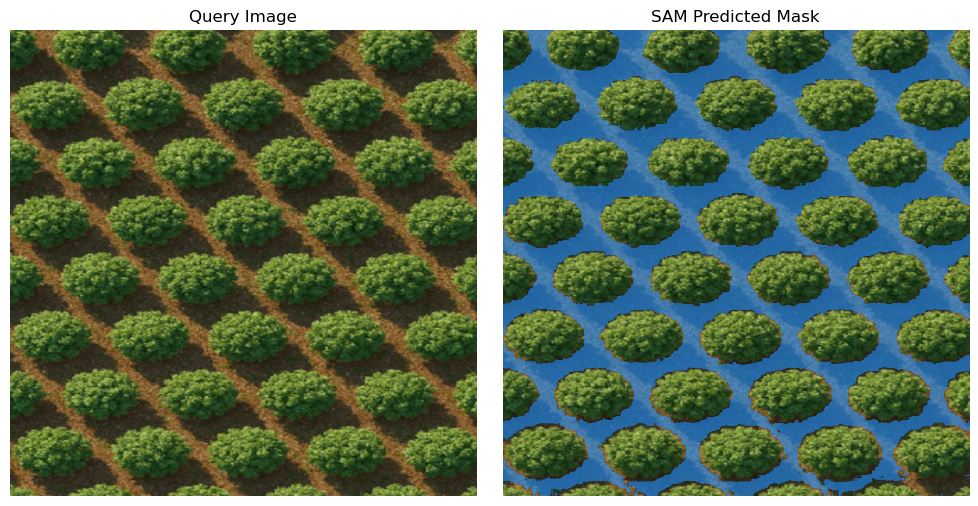


=== Average Metrics ===
IoU:       0.693
Dice:      0.754
Precision: 0.717
Recall:    0.804


In [107]:
# =============================
# SAM Baseline Segmentation Eval (Predictor Version, Fixed)
# =============================

import torch
from torch.nn import functional as F
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor

# ------------------------
# Paths
# ------------------------
ref_folder = './data/fg/support/image/'
inf_folder = './data/fg/query/image/'
mask_folder = './data/fg/query/mask/'
sam_checkpoint = './checkpoints/sam_vit_b_01ec64.pth'  # <- change path to your checkpoint
model_type = "vit_b"

# ------------------------
# Load SAM
# ------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device)
predictor = SamPredictor(sam)

# ------------------------
# Metric + Visualization Utils
# ------------------------
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def compute_metrics(pred_mask, gt_mask):
    pred_mask = pred_mask.astype(np.bool_)
    gt_mask = gt_mask.astype(np.bool_)
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    pred_sum = pred_mask.sum()
    gt_sum = gt_mask.sum()
    iou = intersection / union if union != 0 else 1.0
    dice = (2 * intersection) / (pred_sum + gt_sum) if (pred_sum + gt_sum) != 0 else 1.0
    precision = intersection / pred_sum if pred_sum != 0 else 1.0
    recall = intersection / gt_sum if gt_sum != 0 else 1.0
    return iou, dice, precision, recall

# ------------------------
# Inference + Evaluation
# ------------------------
inf_image_paths = [os.path.join(inf_folder, f) for f in os.listdir(inf_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
results = []

for test_image_path in inf_image_paths:
    filename = os.path.basename(test_image_path)
    mask_path = os.path.join(mask_folder, filename)

    # Load image
    test_image = cv2.imread(test_image_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

    # Set image for SAM
    predictor.set_image(test_image)

    # Use a simple single foreground point (center)
    h, w, _ = test_image.shape
    input_point = np.array([[w // 2, h // 2]])
    input_label = np.array([1])

    # Predict masks (handle 4-return variant)
    output = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True
    )
    masks, scores, logits = output[:3]  # only use the first three outputs

    pred_mask_bin = masks[np.argmax(scores)].astype(np.uint8)

    # Load GT mask
    # Load and invert GT mask (foreground becomes 1, background becomes 0)
    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Convert to binary first
    gt_mask = (gt_mask > 127).astype(np.uint8)

# Invert
    gt_mask = 1 - gt_mask


    # Compute metrics
    iou, dice, precision, recall = compute_metrics(pred_mask_bin, gt_mask)
    results.append((filename, iou, dice, precision, recall))
    print(f"{filename}: IoU={iou:.3f}, Dice={dice:.3f}, Precision={precision:.3f}, Recall={recall:.3f}")

    # Visualization
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image)
    plt.title('Query Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(test_image)
    show_mask(pred_mask_bin, plt.gca())
    plt.title('SAM Predicted Mask')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# ------------------------
# Aggregate metrics
# ------------------------
if results:
    ious, dices, precisions, recalls = zip(*[r[1:] for r in results])
    print("\n=== Average Metrics ===")
    print(f"IoU:       {np.mean(ious):.3f}")
    print(f"Dice:      {np.mean(dices):.3f}")
    print(f"Precision: {np.mean(precisions):.3f}")
    print(f"Recall:    {np.mean(recalls):.3f}")
